# Zomato  Restaurant Data Analysis

# Plotly:
Plotly is one of the finest data visualization tools to create interactive data visualizations online or use the libraries that plotly offers to create these visualizations in the language/ tool of choice. 

This kernel also uses Plotly Express, which is a wrapper around Plotly and helps generate interactive graphs using minimalistic code.

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O 
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from wordcloud import WordCloud
#Imports required for Plotly
import plotly.graph_objs as go
import plotly.offline as py
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True) #This is important 
import plotly_express as px
#Plotly Imports Ends
import warnings
warnings.filterwarnings('ignore')
import os



In [2]:
!pip install WordCloud
from wordcloud import WordCloud


### Reading the dataset

In [3]:
Zomato=pd.read_csv('zomato.csv')
print('We have a total of {0} restaurants in the data set'.format(Zomato.shape[0]))

We have a total of 51717 restaurants in the data set


In [4]:
#vizualizing the first 5 observations
Zomato.head(5)

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


## Performing data cleansing 

In [5]:
 
del Zomato['url']
del Zomato['address']
del Zomato['phone']
del Zomato['location']


Renaming some columns for better interpretability 

In [6]:
Zomato.rename(columns={'listed_in(city)': 'Suburb','listed_in(type)': 'restaurant_type'}, inplace=True)

## viewing the dataset info 

In [7]:
Zomato.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 13 columns):
name                           51717 non-null object
online_order                   51717 non-null object
book_table                     51717 non-null object
rate                           43942 non-null object
votes                          51717 non-null int64
rest_type                      51490 non-null object
dish_liked                     23639 non-null object
cuisines                       51672 non-null object
approx_cost(for two people)    51371 non-null object
reviews_list                   51717 non-null object
menu_item                      51717 non-null object
restaurant_type                51717 non-null object
Suburb                         51717 non-null object
dtypes: int64(1), object(12)
memory usage: 5.1+ MB


We can see that there are some missing values in Votes, which means that not enough paeople have given their ratings for that particular restaurant, thus a consolidated rating is not available. Replacing all the null values in votes with 'Newly Opened'.

In [8]:
Zomato.rate = Zomato.rate.replace(np.nan, 'Newly Opened')

## Data Vizualization 

* ## Total number of Restaurants in each Suburban locality of the city

In [9]:
trace1 = go.Bar(
                x = Zomato.Suburb.value_counts().keys(),
                y = Zomato.Suburb.value_counts(),
                name = "Suburb",
                text = Zomato.Suburb)
data1 = [trace1]
layout = go.Layout(title = 'Restaurant Distribution by Suburb', 
                   barmode = "group", 
                   yaxis=dict(title= 'Number of Restaurants'))
fig = go.Figure(data = data1, layout = layout)
py.offline.iplot(fig, filename = 'basic-line')

The above graph shows that BTM has the maximum number of restaurants in the city followed by Koramangala (all blocks) and Jayanagar.

## Distribution of Restaurant by restaurant-types.

In [10]:
trace1 = go.Bar(
                x = Zomato['restaurant_type'].value_counts().keys(),
                y = Zomato['restaurant_type'].value_counts(),
                name = "restaurant_type",
                text = Zomato['restaurant_type'])
data1 = [trace1]
layout = go.Layout(title = 'Restaurant Distribution by Type', 
                   barmode = "group", 
                   yaxis=dict(title= 'Number of Restaurants'))
fig = go.Figure(data = data1, layout = layout)
py.offline.iplot(fig, filename = 'basic-line')

It can observed that the Restaurants providing home delivery of food are in maximum number across the city (almost to the tune of 25000), followed by Dine-out restaurants and dessert parlours.

## Distribution of Restaurant by SubCategories

In [11]:
trace1 = go.Bar(
                x = Zomato['rest_type'].value_counts().head(15).keys(),
                y = Zomato['rest_type'].value_counts().head(15),
                name = "rest_type",
                text = Zomato['rest_type'])
data1 = [trace1]
layout = go.Layout(title = 'Restaurant Distribution by Sub-Categories', 
                   barmode = "group", 
                   yaxis=dict(title= 'Number of Restaurants'))
fig = go.Figure(data = data1, layout = layout)
py.offline.iplot(fig, filename = 'basic-line')

In the above graph, we can see that there are almost 20,000 restaurants serving quick bites in the city. At the second position, we have casual dining options (10,330 restaurants) followed by cafe's.

In [12]:
x = Zomato['online_order'].value_counts()
trace = go.Pie(labels = x.index, values = x)
layout = go.Layout(title = "Online Order")
fig = go.Figure(data=[trace], layout = layout)
py.iplot(fig, filename='pie_OnlineOrder')

58.9%  restaurants accept online orders on Zomato

In [13]:
x = Zomato['book_table'].value_counts()
trace = go.Pie(labels = x.index, values = x)
layout = go.Layout(title = "Book Table")
fig = go.Figure(data=[trace], layout = layout)
py.iplot(fig, filename='pie_bookTable')

87.5% of Restaurant allows advance booking of tables

## Restaurant ratings v/s Cost for two 

In [14]:
trace = go.Scatter(y = Zomato['approx_cost(for two people)'], text = Zomato['name'], mode = 'markers', x = Zomato['rate'].apply(
                    lambda x: x.split('/')[0])
                   )
data1 = [trace]
layout = go.Layout(title='Cost v/s Ratings', xaxis = dict(title='Restaurant Rating'), yaxis = dict(title='Cost for two'))
fig = go.Figure(data = data1 , layout = layout)
py.iplot(fig, filename='pie_bookTable')

From the above plot, it can be observed that the "cost of two persons" increases for restaurants having ratings greater than 4. Also, one can hover over each data point which signifies individual restaurant.

### Some more data cleansing steps

In [15]:
#Removing the '/5' suffix from restaurant ratings.
#Also removing comma from "approx cost for two people" which is amount in Indian Rupees.
Zomato['rate'] = Zomato['rate'].apply(lambda x: (x.split('/')[0]))
Zomato['approx_cost(for two people)'] = Zomato['approx_cost(for two people)'].str.replace(',','').astype(float)

## approx cost for two people for different cuisines

In [16]:
px.scatter(Zomato, x="cuisines", y="approx_cost(for two people)")

In [17]:
Zomato['approx_cost(for two people)'].dropna(inplace=True)

# Dishes liked by Banaglore

(-0.5, 1499.5, 1499.5, -0.5)

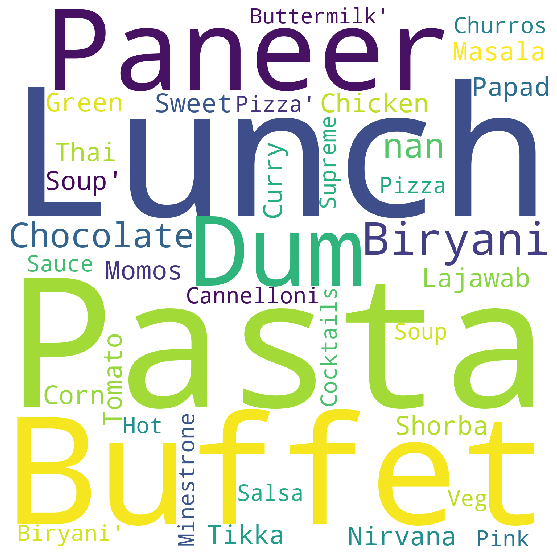

In [18]:
c1 = ''.join(str(Zomato['dish_liked'].values))
from wordcloud import WordCloud
plt.figure(figsize=(10,10))
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(c1)
plt.imshow(wordcloud)
plt.axis("off")


## Popular cuisines in the city

(-0.5, 999.5, 999.5, -0.5)

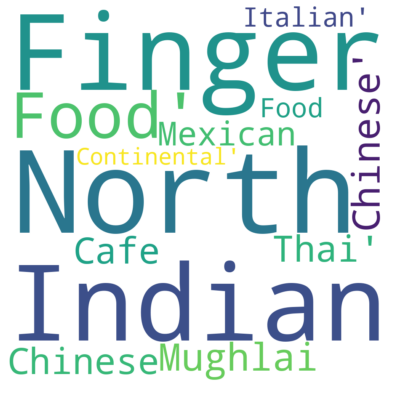

In [19]:
c2 = ''.join(str(Zomato['cuisines'].values))
from wordcloud import WordCloud
plt.figure(figsize=(10,7))
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1000, height=1000).generate(c2)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")

# Largest Restaurant Chains across the City

In [20]:
chain = Zomato['name'].value_counts().head(25).to_frame()
chain['Restaurant Names'] = chain.index
chain.rename(columns={'name':'Count'}, inplace=True)

In [21]:
px.bar(chain, x = 'Restaurant Names', y = 'Count')

Cafe Coffee Day is the largest chain of restaurant in the city. (P.S. Cafe coffee day is Indian version of Starbucks :p )

# Most popular restaurant-types in each Suburb

In [22]:
df_1=Zomato.groupby(['Suburb','rest_type']).agg('count')
data=df_1.sort_values(['name'],ascending=False).groupby(['Suburb'],
                as_index=False).apply(lambda x : x.sort_values(by="name",ascending=False).head(5))['name'].reset_index().rename(columns={'name':'count'})

In [23]:
Zomato.groupby(['Suburb','rest_type']).agg('count').sort_values(['name'],ascending=False).groupby('Suburb').head(1).name

Suburb                 rest_type  
BTM                    Quick Bites    1305
Koramangala 7th Block  Quick Bites    1141
Koramangala 5th Block  Quick Bites    1118
Koramangala 4th Block  Quick Bites    1013
Koramangala 6th Block  Quick Bites     985
Jayanagar              Quick Bites     920
JP Nagar               Quick Bites     820
Marathahalli           Quick Bites     693
HSR                    Quick Bites     668
Bannerghatta Road      Quick Bites     635
Whitefield             Quick Bites     580
Electronic City        Quick Bites     559
Brookefield            Quick Bites     556
Kammanahalli           Quick Bites     555
Basavanagudi           Quick Bites     552
Kalyan Nagar           Quick Bites     539
Lavelle Road           Quick Bites     538
Indiranagar            Quick Bites     534
Church Street          Quick Bites     525
MG Road                Quick Bites     513
Residency Road         Quick Bites     495
Brigade Road           Quick Bites     480
Rajajinagar        

As we can see, quick bites is the most popular restaurant type for each suburb across the City, Let's also explore the most poplular restaurants in quick bites.

In [24]:
quick_bite = Zomato[Zomato['rest_type'] == 'Quick Bites'].name.value_counts().head(20).to_frame()
quick_bite['Restaurant Name'] = quick_bite.index
quick_bite.rename(columns={'name':'Count'}, inplace=True)
px.bar(quick_bite, x='Restaurant Name', y='Count')

Five star chicken, Domino's Pizza and Mcdonalds are dominating the 'quick bites' market.

# Top 10 Cuisines

In [25]:
cuisines = Zomato['cuisines'].value_counts().head(10).to_frame()
cuisines['Cuisine names'] = cuisines.index
px.bar(cuisines, x="Cuisine names", y="cuisines")

As seen in the word cloud, the above graph tells the same story that North indian restaurants are highest in numbers across the city(almost 3k) followed by those serving chinese and South indian cuisines. Also there are significant number of Biryani outlets in the city. (Biryani is made with Indian spices, rice, meat (chicken, goat, beef, lamb, prawn, or fish), vegetables or eggs.)

In [26]:
print(Zomato.head())

                    name online_order book_table rate  votes  \
0                  Jalsa          Yes        Yes  4.1    775   
1         Spice Elephant          Yes         No  4.1    787   
2        San Churro Cafe          Yes         No  3.8    918   
3  Addhuri Udupi Bhojana           No         No  3.7     88   
4          Grand Village           No         No  3.8    166   

             rest_type                                         dish_liked  \
0        Casual Dining  Pasta, Lunch Buffet, Masala Papad, Paneer Laja...   
1        Casual Dining  Momos, Lunch Buffet, Chocolate Nirvana, Thai G...   
2  Cafe, Casual Dining  Churros, Cannelloni, Minestrone Soup, Hot Choc...   
3          Quick Bites                                        Masala Dosa   
4        Casual Dining                                Panipuri, Gol Gappe   

                         cuisines  approx_cost(for two people)  \
0  North Indian, Mughlai, Chinese                        800.0   
1     Chinese, North

In [27]:
Zomato.rest_type.unique()

array(['Casual Dining', 'Cafe, Casual Dining', 'Quick Bites',
       'Casual Dining, Cafe', 'Cafe', 'Quick Bites, Cafe',
       'Cafe, Quick Bites', 'Delivery', 'Mess', 'Dessert Parlor',
       'Bakery, Dessert Parlor', 'Pub', 'Bakery', 'Takeaway, Delivery',
       'Fine Dining', 'Beverage Shop', 'Sweet Shop', 'Bar',
       'Beverage Shop, Quick Bites', 'Confectionery',
       'Quick Bites, Beverage Shop', 'Dessert Parlor, Sweet Shop',
       'Bakery, Quick Bites', 'Sweet Shop, Quick Bites', 'Kiosk',
       'Food Truck', 'Quick Bites, Dessert Parlor',
       'Beverage Shop, Dessert Parlor', 'Takeaway', 'Pub, Casual Dining',
       'Casual Dining, Bar', 'Dessert Parlor, Beverage Shop',
       'Quick Bites, Bakery', 'Dessert Parlor, Quick Bites',
       'Microbrewery, Casual Dining', 'Lounge', 'Bar, Casual Dining',
       'Food Court', 'Cafe, Bakery', nan, 'Dhaba',
       'Quick Bites, Sweet Shop', 'Microbrewery',
       'Food Court, Quick Bites', 'Pub, Bar', 'Casual Dining, Pub',
      

In [28]:
Zomato.restaurant_type.unique()

array(['Buffet', 'Cafes', 'Delivery', 'Desserts', 'Dine-out',
       'Drinks & nightlife', 'Pubs and bars'], dtype=object)

In [29]:
Zomato.book_table.unique()

array(['Yes', 'No'], dtype=object)

In [30]:
Zomato.online_order.unique()

array(['Yes', 'No'], dtype=object)

In [31]:
Zomato['online_order'] = Zomato['online_order'].map({'No':0, 'Yes':1})
Zomato['online_order'].unique()

array([1, 0], dtype=int64)

In [32]:
Zomato['book_table'] = Zomato['book_table'].map({'No':0, 'Yes':1})
Zomato['book_table'].unique()

array([1, 0], dtype=int64)

In [33]:
Zomato['restaurant_type'] = Zomato['restaurant_type'].map({'Buffet':0, 'Cafes':1, 'Delivery':2, 'Desserts':3, 'Dine-out':4,'Drinks & nightlife':5, 'Pubs and bars':6})
Zomato['restaurant_type'].unique()

array([0, 1, 2, 3, 4, 5, 6], dtype=int64)

In [34]:
Zomato.head()

,name,online_order,book_table,rate,votes,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,restaurant_type,Suburb
0,Jalsa,1,1,4.1,775,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],0,Banashankari
1,Spice Elephant,1,0,4.1,787,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],0,Banashankari
2,San Churro Cafe,1,0,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],0,Banashankari
3,Addhuri Udupi Bhojana,0,0,3.7,88,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],0,Banashankari
4,Grand Village,0,0,3.8,166,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],0,Banashankari


In [35]:
#Zomato.mean()

In [37]:
Zomato.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 13 columns):
name                           51717 non-null object
online_order                   51717 non-null int64
book_table                     51717 non-null int64
rate                           51717 non-null object
votes                          51717 non-null int64
rest_type                      51490 non-null object
dish_liked                     23639 non-null object
cuisines                       51672 non-null object
approx_cost(for two people)    51371 non-null float64
reviews_list                   51717 non-null object
menu_item                      51717 non-null object
restaurant_type                51717 non-null int64
Suburb                         51717 non-null object
dtypes: float64(1), int64(4), object(8)
memory usage: 5.1+ MB


In [39]:
Zomato['rate'] = pd.to_numeric(Zomato['rate'],errors='coerce')

In [40]:
Zomato.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 13 columns):
name                           51717 non-null object
online_order                   51717 non-null int64
book_table                     51717 non-null int64
rate                           41665 non-null float64
votes                          51717 non-null int64
rest_type                      51490 non-null object
dish_liked                     23639 non-null object
cuisines                       51672 non-null object
approx_cost(for two people)    51371 non-null float64
reviews_list                   51717 non-null object
menu_item                      51717 non-null object
restaurant_type                51717 non-null int64
Suburb                         51717 non-null object
dtypes: float64(2), int64(4), object(7)
memory usage: 5.1+ MB


In [41]:
Zomato.rate.mean()

3.700448817952717

In [44]:
table = pd.crosstab(Zomato['rate'], Zomato['restaurant_type'])
table

restaurant_type,0,1,2,3,4,5,6
rate,,,,,,,
1.8,0,0,0,0,5,0,0
2.0,0,0,1,0,6,4,0
2.1,0,0,16,0,8,0,0
2.2,0,0,11,0,15,0,0
2.3,5,1,22,0,23,0,0
2.4,0,2,33,1,30,2,2
2.5,1,2,54,1,41,1,1
2.6,3,10,146,5,90,5,1
2.7,4,9,138,9,138,6,3


In [46]:
import scipy.stats
chi2, p, dof, expected= scipy.stats.chi2_contingency(table.values)

In [47]:
##lets analyse Results
print('chi-square statistic: ', chi2)
print('p-value: ', p)
if (p > 0.05):
    print('We Reject Null Hypothesis')
else:
    print('We Accept Null Hypothesis')

chi-square statistic:  3278.9218968796295
p-value:  0.0
We Accept Null Hypothesis


In [50]:
# median of sample_mean
median_of_sample_means = np.median(Zomato['approx_cost(for two people)'])
median_of_sample_means

nan